# Анализ данных на Python

## Библиотека `Plotly`

<a target="_blank" href="https://plotly.com/python/">Plotly</a> &mdash; бесплатная графическая библиотека с открытым исходным кодом, в последние годы набирающая популярность в Data Science среде. Ее ключевое преимущество перед `seaborn` и `matplotlib` — удобство построения сложных интерактивных визуализаций — полноценных мини-приложений, которые делают результат работы аналитика более доступным для конечного пользователя. 


Подробнее про установку можно почитать на <a target="_blank" href="https://plotly.com/python/getting-started/">этой</a> странице.

In [47]:
!pip install ipykernel
!pip install --upgrade nbformat

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [48]:
import numpy as np
import scipy.stats as sps
import pandas as pd
import matplotlib.pyplot as plt
import datetime

import plotly
import plotly.graph_objects as go
import plotly.express as px

### 1. Простые графики

#### График функций

Предположим, мы хотим нарисовать на отрезке $[-1, 1]$ функции $f(x) = x^2$ и $g(x) = \sin(10x)$. Определим значения функций по сетке

In [49]:
x = np.linspace(-1, 1, 101)
y1 = x**2
y2 = np.sin(10*x)

Построить график с помощью `matplotlib` можно следующим образом

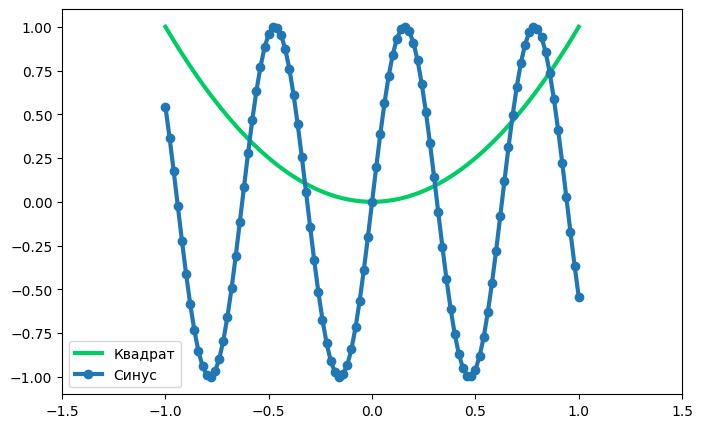

In [50]:
plt.figure(figsize=(8, 5))
plt.plot(x, y1, label='Квадрат', lw=3, color='#00CC66')
plt.plot(x, y2, label='Синус', lw=3, marker='o')
plt.legend()
plt.xlim((-1.5, 1.5))
plt.show()

С помощью `plotly` графики рисуются с помощью следующей общей конструкции:

```python
    fig = go.Figure()
    fig.add_trace(что рисовать)
    fig.update_layout(параметры фигуры)
    fig.update_xaxes(параметры оси абсцисс)
    fig.update_yaxes(параметры оси ординат)
    fig.show()
```

Теперь нарисуем наши функции с помощью `plotly`.

In [51]:
# объявляем фигуру
fig = go.Figure()

# добавляем первый график
fig.add_trace(
    go.Scatter(
        x=x, y=y1,  # данные
        name='Квадрат',  # имя в легенде
        marker=dict(color='#00CC66'),  # цвет в html-формате 
        opacity=0.8,  # прозрачность
        line={'width': 3}  # свойства линии - толщина
    )
)

# добавляем второй график
fig.add_trace(
    go.Scatter(
        x=x, y=y2,  # данные
        mode='lines+markers',  # линии и точки
        name='Синус',  # имя в легенде
        marker=dict(  # свойства маркера
            color='rgba(255,48,0,1)',  # цвет в rgb-формате 
            size=7  # размер маркера
        ), 
        opacity=0.8,  # прозрачность
        line={'width': 3}  # свойства линии - толщина
    )
)

# свойства фигуры
fig.update_layout(
    height=450, width=700,  # размер фигуры
    title_text='Простой график функций',  # заголовок графика
    title_font_size=16,  # размер заголовка
    plot_bgcolor='rgba(0,0,0,0.05)',  # цвет фона
)

# параметры оси абсцисс
fig.update_xaxes(
    range=[-1.5, 1.5],  # ограничение графика
    zeroline=True,  # рисовать линию x=0
    zerolinewidth=2  # толщина линии x=0
)

# параметры оси ординат
fig.update_yaxes(
    zeroline=True,  # рисовать линию y=0
    zerolinewidth=2,  # толщина линии y=0
    zerolinecolor='LightGray'  # цвет линии y=0
)

# показать график
fig.show()

График интерактивный:
* при наведении мышкой на линию появляется окошко, в которой указаны координаты точки и имя линии;
* с помощью выделения можно указать прямоугольную область, которую нужно приблизить;
* вернуть исходный масштаб можно двойныл щелчком или кнопкой на панели сверху;
* кликами по легенде можно убирать линии с графика.


Следующей функцией можно сохранить фигуру в html-формате.

In [52]:
plotly.offline.plot(fig, filename='example.html', auto_open=False)

'example.html'

*Замечание.*
На сайте Plotly содержится полная документация со списом всех возможных параметров. Если параметр принимает в качестве значения словарь других параметров, то в документации приводится также список этих параметров.
Ссылки на документацию для конкретных функций:
* <a target="_blank" href="https://plotly.com/python/reference/scatter/">Scatter</a>;
* <a target="_blank" href="https://plotly.com/python/reference/layout/">update_layout</a>;
* <a target="_blank" href="https://plotly.com/python/reference/layout/xaxis/">update_xaxes</a>;
* <a target="_blank" href="https://plotly.com/python/reference/layout/yaxis/">update_yaxes</a>.

#### Капитализация Apple

Загрузим данные с информацией о капитализации компании Apple в зависимости от месяца.

In [53]:
df = pd.read_csv(
    'https://raw.githubusercontent.com/'\
    'plotly/datasets/master/finance-charts-apple.csv'
)
df.head()

,Date,AAPL.Open,AAPL.High,AAPL.Low,AAPL.Close,AAPL.Volume,AAPL.Adjusted,dn,mavg,up,direction
0,2015-02-17,127.489998,128.880005,126.919998,127.830002,63152400,122.905254,106.741052,117.927667,129.114281,Increasing
1,2015-02-18,127.629997,128.779999,127.449997,128.720001,44891700,123.760965,107.842423,118.940333,130.038244,Increasing
2,2015-02-19,128.479996,129.029999,128.330002,128.449997,37362400,123.501363,108.894245,119.889167,130.884089,Decreasing
3,2015-02-20,128.619995,129.500000,128.050003,129.500000,48948400,124.510914,109.785449,120.763500,131.741551,Increasing
4,2015-02-23,130.020004,133.000000,129.660004,133.000000,70974100,127.876074,110.372516,121.720167,133.067817,Increasing


Построим график по этим данным, к которому добавим также слайдер, предоставляющий возможность возможность выделять интересующий диапазон дат.

In [54]:
fig = go.Figure()

# две кривые
fig.add_trace(go.Scatter(x=df.Date, y=df['AAPL.High'], name="AAPL High"))
fig.add_trace(go.Scatter(x=df.Date, y=df['AAPL.Low'], name="AAPL Low"))

# свойства графика
fig.update_layout(
    title_text='Финансы компании "Apple"',
    title_font_size=20,
    yaxis_title='Стоимость',
    xaxis_rangeslider_visible=True  # слайдер
)

fig.show()

### 2. Несколько графиков

Сгенерируем 5 выборок размера 200 и посчитаем по каждой из них кумулятивные суммы

In [55]:
x = sps.norm.rvs(size=(5, 200)).cumsum(axis=1)

Визуализируем каждую кривую на своем графике. Мы также свяжем между собой горизонтальные координатные оси. Это свойство позволяет одновременно масштабировать каждый график, что полезно в случае если величины разные по смыслу.

In [56]:
# объявляем сетку графиков
import plotly.subplots


fig = plotly.subplots.make_subplots(
    rows=5, cols=1,  # 5 строк и 1 столбец
    shared_xaxes=True,  # горизонтальные оси связаны при изменении масштаба
    vertical_spacing=0.02  # расстояние между графиками
)

# рисуем каждый график отдельно
for i in range(5):
    fig.add_trace(
        go.Scatter(
            x=np.arange(200), y=x[i]
        ), 
        i+1, 1  # расположение графика в сетке, нумерация с 1
    )
    
fig.show()

#### Датчики

Рассмотрим более сложный пример о <a target="_blank" href="https://archive.ics.uci.edu/ml/datasets/Gas+sensor+array+exposed+to+turbulent+gas+mixtures">датчиках</a>, подверженных воздействию турбулентных газовых смесей. В данных за 5 минут содержатся измерения температуры, относительной влажности воздуха, а также показания 8 датчиков. 

Загрузим данные

In [57]:
data = pd.read_csv('./dataset_two_gas_sources_/dataset_twosources_raw/006_Et_M_CO_M', header=None)
data.columns = ['Time (s)', 'Temperature (oC)', 'Relative Humidity (%)',
                'TGS2600', 'TGS2602', 'TGS2602', 'TGS2620', 
                'TGS2612', 'TGS2620', 'TGS2611', 'TGS2610']
data.head()

,Time (s),Temperature (oC),Relative Humidity (%),TGS2600,TGS2602,TGS2602,TGS2620,TGS2612,TGS2620,TGS2611,TGS2610
0,1.72,22.45,40.63,347.0,275.0,536.0,624.0,596.0,741.0,668.0,760.0
1,1.74,22.45,40.63,348.0,275.0,537.0,624.0,596.0,740.0,668.0,760.0
2,1.76,22.45,40.63,346.0,275.0,536.0,624.0,596.0,740.0,668.0,760.0
3,1.78,22.45,40.63,349.0,275.0,536.0,624.0,596.0,740.0,668.0,760.0
4,1.80,22.45,40.63,348.0,275.0,536.0,624.0,596.0,741.0,668.0,760.0


Определим какое-то интерпретируемое время

In [58]:
time = pd.Timestamp('2021-04-03 16:30:00') + data.iloc[:, 0] * pd.Timedelta('1 sec')

Нарисуем график в три ряда, в которых на первые два нанесем температуру и относительную влажность, а на последний &mdash; показания всех датчиков. В данном случае показания датчиков имеют одинаковый смысл и одинаковую размерность, поэтому их можно наносить на один график, а температура и влажность имеют свою размерность, поэтому их необходимо рисовать на отдельном графике. Поскольку все показания датчиков на одном графике, то для удобства анализа стоит этот график сделать шире.

In [59]:
# объявляем сетку графиков
fig = plotly.subplots.make_subplots(
    rows=3, cols=1,  # 3 строки и 1 столбец
    shared_xaxes=True,  # горизонтальные оси связаны при изменении масштаба
    vertical_spacing=0.1,  # расстояние между графиками
    row_heights=[0.25, 0.25, 0.5],  # высота каждой строки
    subplot_titles=['Температура', 'Относительная влажность', 'Показания датчиков']
)

# визуализируем температуру и влажность
for i in [1, 2]:
    fig.add_trace(
        go.Scatter(
            x=time, y=data.iloc[:, i],
            name=data.columns[i],
        ), 
        i, 1
    )

# визуализируем показания датчиков
for i in range(8):
    fig.add_trace(
        go.Scatter(
            x=time, y=data.iloc[:, 3+i],
            name=data.columns[3+i]
        ), 
        3, 1
    )
    
fig.show()

Подробнее о `make_subplots` можно почитать в <a target="_blank" href="https://plotly.com/python-api-reference/generated/plotly.subplots.make_subplots.html">документации</a>.

### 3. Plotly Express

Вместо обычного Plotly можно использовать Plotly Express — набора шаблонов для быстрой и красивой визуализации, подобно тому как seaborn по отношению к matplotlib.

Рассмотрим встроенные в Plotly данные [Gapminder Foundation](https://en.wikipedia.org/wiki/Gapminder_Foundation) — просветительской Шведской организации, которая анализирует финансовое неравенство в мире.

In [60]:
df = px.data.gapminder()
df.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4


Следующая функция строит интерактивный график, где по одной оси отложен ВВП, по другой — прогноз средней продолжительности жизни. Размер каждой точки на графике пропорционален размеру государства. 

На графике присутствует слайдер, с помощью которого можно выбирать конкретный год.

In [61]:
px.scatter(
    df,  # таблица с данными
    x="gdpPercap", y="lifeExp",  # названия колонок, используемых как координата
    animation_frame="year",  # колонка, определяющая слайдер
    animation_group="country",  # колонка, отвечающая за объект (страну)
    size="pop",  # колонка, отвечающая за размер точек
    color="continent",  # колонка, отвечающая за цвет точек
    hover_name="country",  # колонка, отвечающая за подпись информации о точке
    log_x=True,  # логарифмический масштаб
    size_max=55,  # максимальный размер круга
    range_x=[100, 100000], range_y=[25, 90]  # пределы графика
)

Подробнее о `plotly.express.scatter` можно почитать в <a target="_blank" href="https://plotly.com/python-api-reference/generated/plotly.express.scatter.html">документации</a>.

### 4. Heatmap

Представим, что у нас есть 7 программистов, каждый из которых делает коммиты в гит. Сгенерируем такие данные.

In [62]:
programmers = [
    'Дмитрий', 'Вячеслав', 'Надежда', 'Егор', 'Никита', 'Елизавета', 'София'
]

# сегодняшняя дата
base = datetime.datetime.today()
# диапазон дат
dates = base - pd.timedelta_range(start=0, freq='1D', periods=60)
# генерируем количество за день
z = sps.poisson(mu=1).rvs(size=(len(programmers), len(dates)))

Так с помощью  Plotly можно проанализировать историю коммитов членов команды за два месяца работы.

In [63]:
fig = go.Figure()

fig.add_trace(
    go.Heatmap(
        z=z,  # данные
        x=dates,  # имена столбцов 
        y=programmers,  # имена строк
        colorscale='Viridis'  # цветовая схема
    )
)

fig.update_layout(
    title='Коммиты на GitHub по дням',
    height=350, 
    xaxis_nticks=20
)

fig.show()

Подробнее о `Heatmap` можно почитать в <a target="_blank" href="https://plotly.github.io/plotly.py-docs/generated/plotly.graph_objects.Heatmap.html">документации</a>.

### 5. Картографические данные

Загрузим данные о землетрясениях, в которых указаны дата, координата и магнитуда.

In [64]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/earthquakes-23k.csv')
df.head()

,Date,Latitude,Longitude,Magnitude
0,01/02/1965,19.246,145.616,6.0
1,01/04/1965,1.863,127.352,5.8
2,01/05/1965,-20.579,-173.972,6.2
3,01/08/1965,-59.076,-23.557,5.8
4,01/09/1965,11.938,126.427,5.8


Визуализируем

In [65]:
fig = px.density_mapbox(
    df,  # таблица с данными
    lat='Latitude', lon='Longitude',  # колонки с координатами
    z='Magnitude',  # колонки со значением исследуемой величины
    radius=10,  # радиус влияния каждой точки
    center=dict(lat=0, lon=180),  # центр карты
    zoom=0,  # масштаб карты
    mapbox_style="stamen-terrain"  # стиль карты
)
fig.show()

Подробнее о `plotly.express.density_mapbox` можно почитать в <a target="_blank" href="https://plotly.com/python-api-reference/generated/plotly.express.density_mapbox.html">документации</a>.

### Галерея

С более продвинутыми визуализациями можно ознакомиться [в официальной галерее](https://plot.ly/python/).

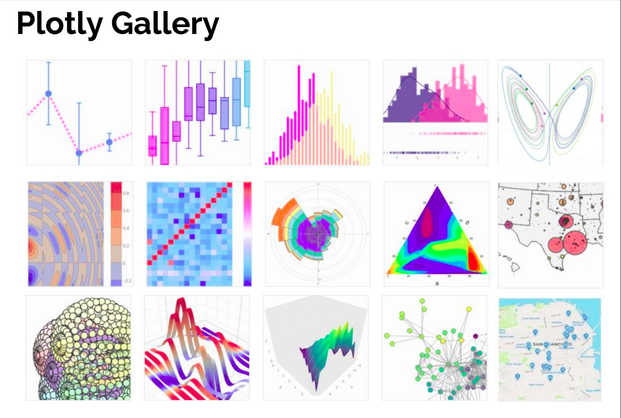